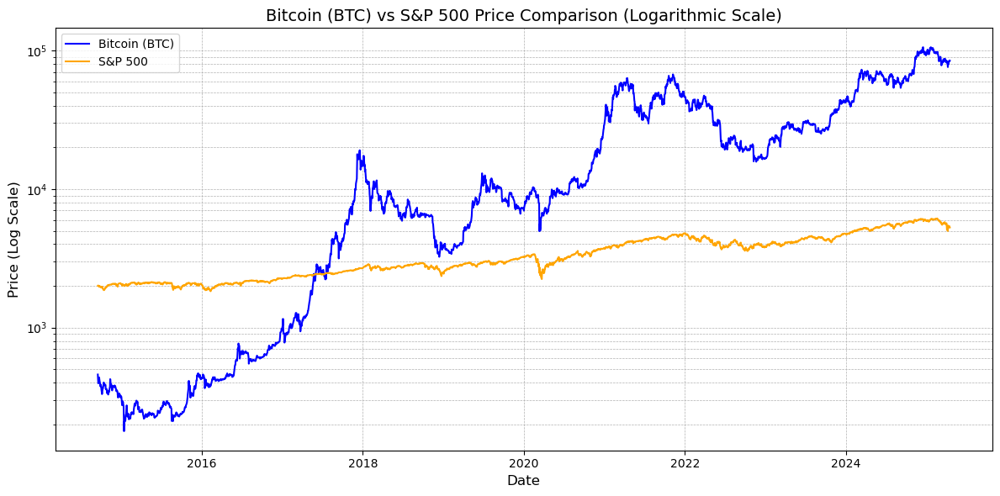

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your data (replace these with your actual file paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Merge the datasets on the 'Date' column
merged_df = pd.merge(btc_df[['Date', 'Close']], sp500_df[['Date', 'Close']], on='Date', how='inner', suffixes=('_btc', '_sp500'))

# Plot the data
plt.figure(figsize=(12, 6))

# Plot Bitcoin and S&P 500 with a logarithmic scale
plt.plot(merged_df['Date'], merged_df['Close_btc'], label="Bitcoin (BTC)", color='blue')
plt.plot(merged_df['Date'], merged_df['Close_sp500'], label="S&P 500", color='orange')

# Apply log scale to the y-axis
plt.yscale('log')

# Add titles and labels
plt.title("Bitcoin (BTC) vs S&P 500 Price Comparison (Logarithmic Scale)", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Price (Log Scale)", fontsize=12)

# Display the legend
plt.legend()

# Show grid for better readability
plt.grid(True, which="both", linestyle='--', linewidth=0.5)

# Adjust layout to make it fit
plt.tight_layout()

# Display the plot
plt.show()


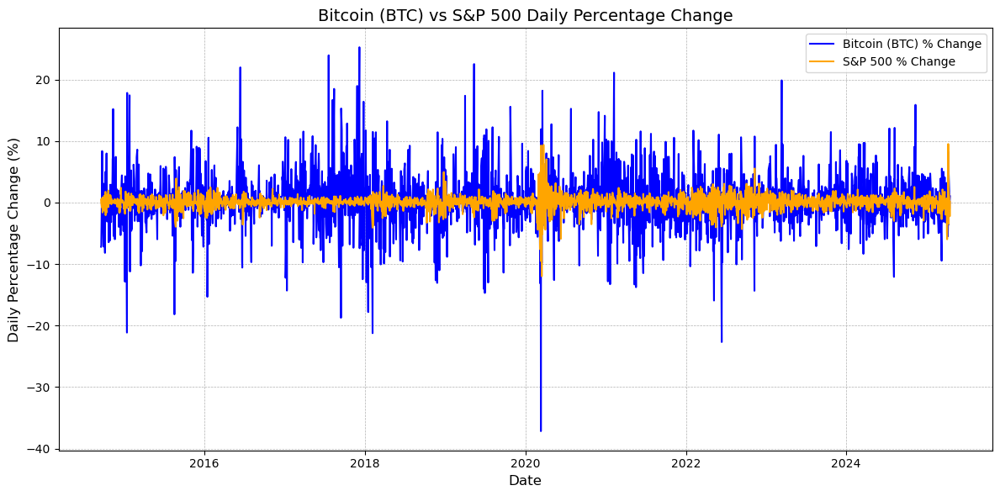

In [30]:
import pandas as pd
import matplotlib.pyplot as plt

# Load your data (replace these with your actual file paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Merge the datasets on the 'Date' column
merged_df = pd.merge(btc_df[['Date', 'Close']], sp500_df[['Date', 'Close']], on='Date', how='inner', suffixes=('_btc', '_sp500'))

# Calculate the daily percentage change for Bitcoin and S&P 500
merged_df['pct_change_btc'] = merged_df['Close_btc'].pct_change() * 100  # Percentage change for Bitcoin
merged_df['pct_change_sp500'] = merged_df['Close_sp500'].pct_change() * 100  # Percentage change for S&P 500

# Plot the percentage change
plt.figure(figsize=(12, 6))

# Plot Bitcoin and S&P 500 percentage change
plt.plot(merged_df['Date'], merged_df['pct_change_btc'], label="Bitcoin (BTC) % Change", color='blue')
plt.plot(merged_df['Date'], merged_df['pct_change_sp500'], label="S&P 500 % Change", color='orange')

# Add titles and labels
plt.title("Bitcoin (BTC) vs S&P 500 Daily Percentage Change", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Daily Percentage Change (%)", fontsize=12)

# Display the legend
plt.legend()

# Show grid for better readability
plt.grid(True, which="both", linestyle='--', linewidth=0.5)

# Adjust layout to make it fit
plt.tight_layout()

# Display the plot
plt.show()


/var/folders/j0/w_nkzt051mn4tt9zkz40drc80000gp/T/ipykernel_69184/3719498548.py:17: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/var/folders/j0/w_nkzt051mn4tt9zkz40drc80000gp/T/ipykernel_69184/3719498548.py:18: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



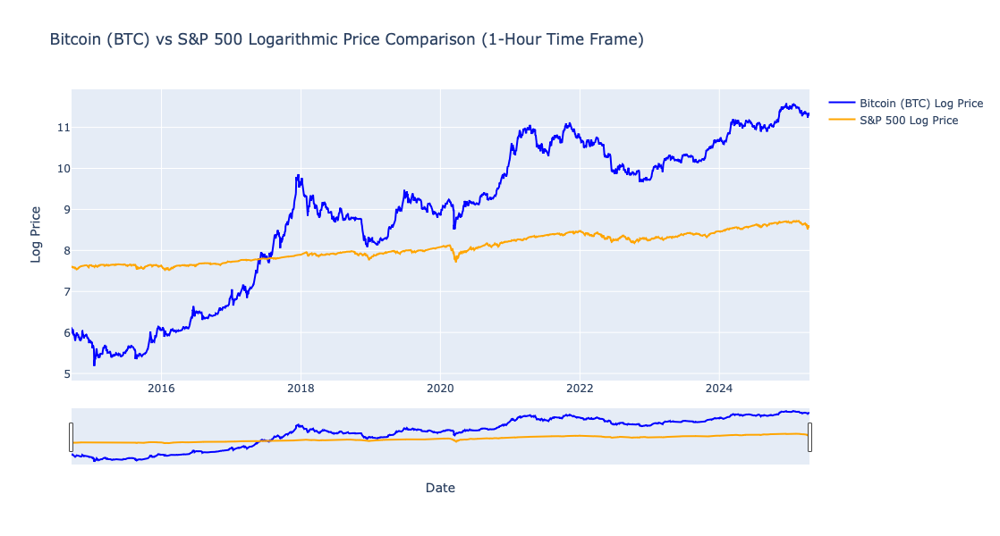

In [37]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('H').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('H').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc']], sp500_hourly[['log_sp500']], left_index=True, right_index=True, how='inner')

# Create the interactive plot with Plotly
fig = go.Figure()

# Add Bitcoin Log Price to the plot
fig.add_trace(go.Scatter(x=merged_df.index, y=merged_df['log_btc'], mode='lines', name='Bitcoin (BTC) Log Price',
                         line=dict(color='blue'),
                         hovertemplate="<b>Date:</b> %{x}<br><b>Price:</b> %{y:.2f}<br><b>Log of Price</b>"))

# Add S&P 500 Log Price to the plot
fig.add_trace(go.Scatter(x=merged_df.index, y=merged_df['log_sp500'], mode='lines', name='S&P 500 Log Price',
                         line=dict(color='orange'),
                         hovertemplate="<b>Date:</b> %{x}<br><b>Price:</b> %{y:.2f}<br><b>Log of Price</b>"))

# Update layout for interactivity and make the chart bigger
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    width=1200,  # Increase the width of the chart
    height=600   # Increase the height of the chart
)

# Show the plot
fig.show()


/var/folders/j0/w_nkzt051mn4tt9zkz40drc80000gp/T/ipykernel_69184/3716333585.py:17: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.

/var/folders/j0/w_nkzt051mn4tt9zkz40drc80000gp/T/ipykernel_69184/3716333585.py:18: FutureWarning:

'H' is deprecated and will be removed in a future version, please use 'h' instead.



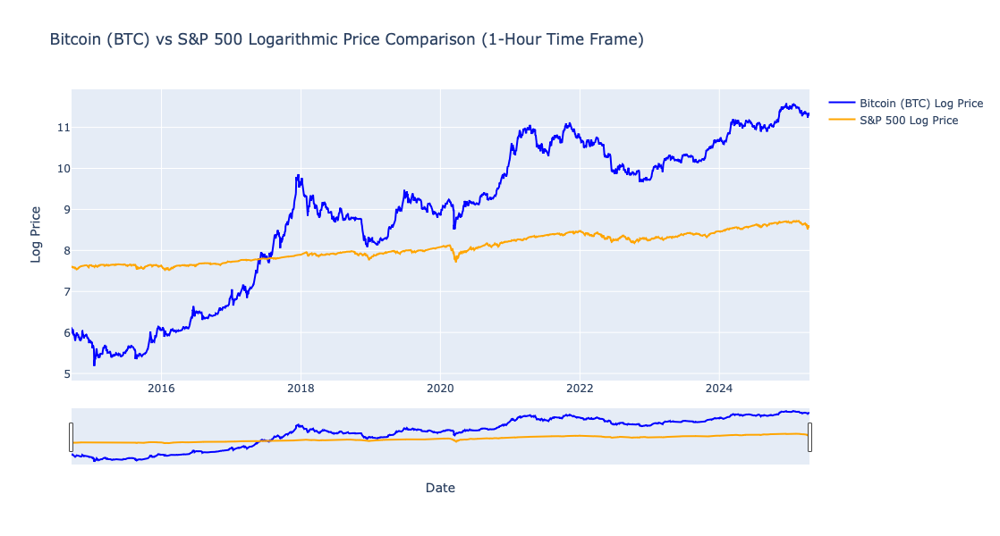

In [40]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('H').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('H').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Add Bitcoin Log Price to the plot
fig.add_trace(go.Scatter(x=merged_df.index, y=merged_df['log_btc'], mode='lines', name='Bitcoin (BTC) Log Price',
                         line=dict(color='blue'),
                         hovertemplate="<b>Date:</b> %{x}<br><b>Real Price:</b> %{customdata[0]:.2f}<br><b>Log of Price:</b> %{y:.2f}",
                         customdata=merged_df[['Close_btc']].values))  # Using the Close_btc column for real price

# Add S&P 500 Log Price to the plot
fig.add_trace(go.Scatter(x=merged_df.index, y=merged_df['log_sp500'], mode='lines', name='S&P 500 Log Price',
                         line=dict(color='orange'),
                         hovertemplate="<b>Date:</b> %{x}<br><b>Real Price:</b> %{customdata[0]:.2f}<br><b>Log of Price:</b> %{y:.2f}",
                         customdata=merged_df[['Close_sp500']].values))  # Using the Close_sp500 column for real price

# Update layout for interactivity and make the chart bigger
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    width=1200,  # Increase the width of the chart
    height=600   # Increase the height of the chart
)

# Show the plot
fig.show()


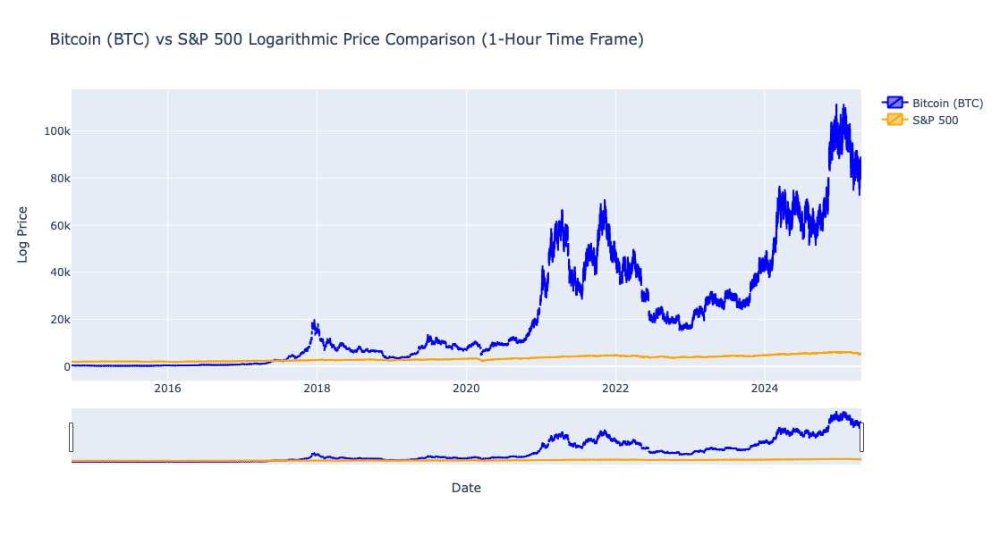

In [44]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='blue', decreasing_line_color='blue',
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='orange', decreasing_line_color='orange',
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity and make the chart bigger
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    width=1200,  # Increase the width of the chart
    height=600   # Increase the height of the chart
)

# Show the plot
fig.show()


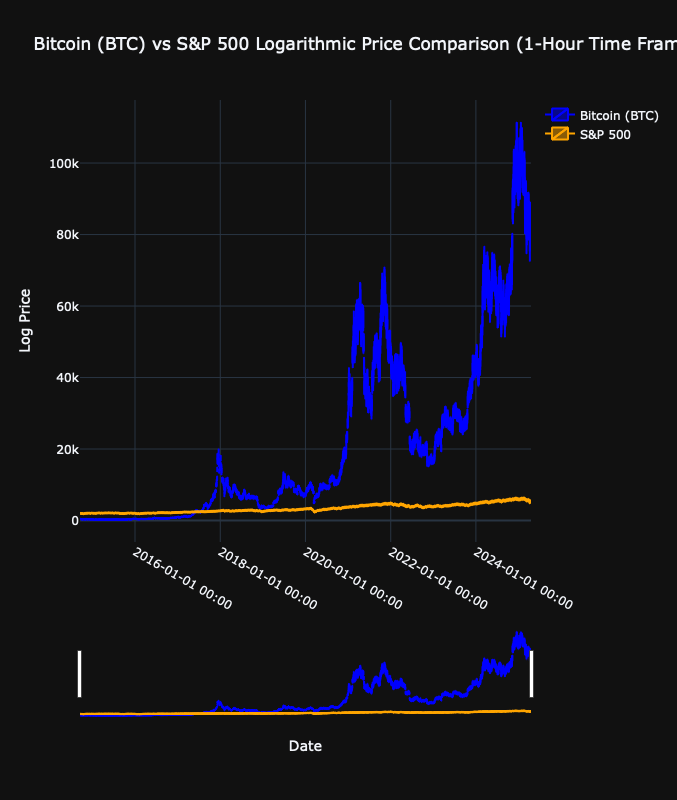

In [46]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='blue', decreasing_line_color='blue',
                             whiskerwidth=1,  # Adjust whisker width for better clarity
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='orange', decreasing_line_color='orange',
                             whiskerwidth=1,  # Adjust whisker width for better clarity
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity, adjust chart size, and make the chart clearer
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    xaxis=dict(
        showgrid=True,  # Show grid for better visualization
        zeroline=False,  # Hide the zero line for cleaner appearance
        rangeslider=dict(visible=True),  # Enable range slider for zooming
        type="date",  # Ensure the x-axis shows date
        tickformat="%Y-%m-%d %H:%M",  # Format for ticks (year-month-day hour-minute)
    ),
    yaxis=dict(
        showgrid=True,  # Show grid for better visualization
    ),
    width=1800,  # Increase width for better clarity
    height=800,  # Increase height for better clarity
    template="plotly_dark",  # Dark background (optional)
    showlegend=True  # Enable legend for both traces
)

# Show the plot
fig.show()


In [48]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='blue', decreasing_line_color='blue',
                             increasing_line_width=5,  # Thicker candlestick body
                             decreasing_line_width=5,  # Thicker candlestick body
                             whiskerwidth=3,  # Thicker whiskers (lines)
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='orange', decreasing_line_color='orange',
                             increasing_line_width=5,  # Thicker candlestick body
                             decreasing_line_width=5,  # Thicker candlestick body
                             whiskerwidth=3,  # Thicker whiskers (lines)
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity, adjust chart size, and make the chart clearer
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    xaxis=dict(
        showgrid=True,  # Show grid for better visualization
        zeroline=False,  # Hide the zero line for cleaner appearance
        rangeslider=dict(visible=True),  # Enable range slider for zooming
        type="date",  # Ensure the x-axis shows date
        tickformat="%Y-%m-%d %H:%M",  # Format for ticks (year-month-day hour-minute)
    ),
    yaxis=dict(
        showgrid=True,  # Show grid for better visualization
    ),
    width=1800,  # Increase width for better clarity
    height=800,  # Increase height for better clarity
    template="plotly_dark",  # Dark background (optional)
    showlegend=True  # Enable legend for both traces
)

# Show the plot
fig.show()


ValueError: 
    Invalid value of type 'builtins.int' received for the 'whiskerwidth' property of candlestick
        Received value: 3

    The 'whiskerwidth' property is a number and may be specified as:
      - An int or float in the interval [0, 1]

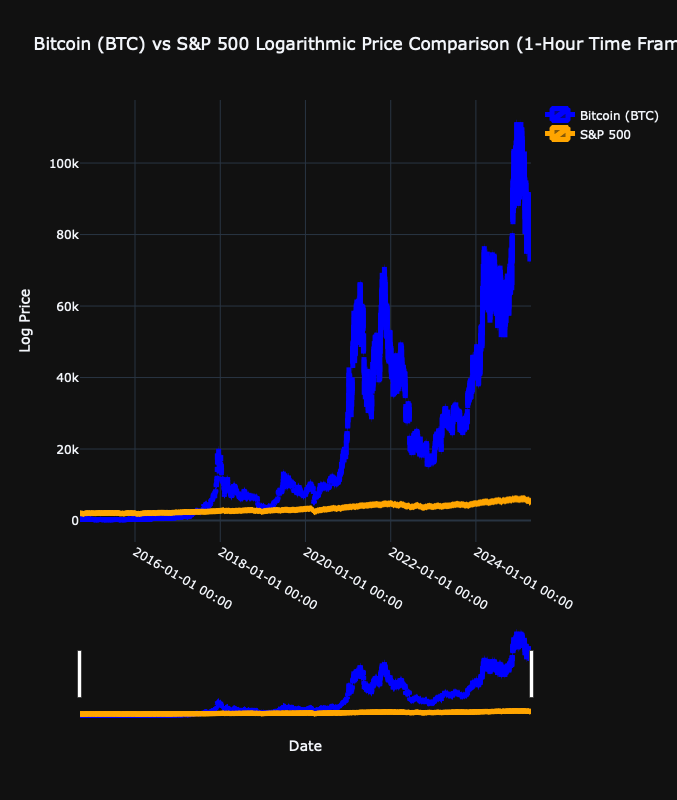

In [50]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='blue', decreasing_line_color='blue',
                             increasing_line_width=5,  # Thicker candlestick body
                             decreasing_line_width=5,  # Thicker candlestick body
                             whiskerwidth=0.7,  # Adjusted whisker width to a value between 0 and 1
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='orange', decreasing_line_color='orange',
                             increasing_line_width=5,  # Thicker candlestick body
                             decreasing_line_width=5,  # Thicker candlestick body
                             whiskerwidth=0.7,  # Adjusted whisker width to a value between 0 and 1
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity, adjust chart size, and make the chart clearer
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    xaxis=dict(
        showgrid=True,  # Show grid for better visualization
        zeroline=False,  # Hide the zero line for cleaner appearance
        rangeslider=dict(visible=True),  # Enable range slider for zooming
        type="date",  # Ensure the x-axis shows date
        tickformat="%Y-%m-%d %H:%M",  # Format for ticks (year-month-day hour-minute)
    ),
    yaxis=dict(
        showgrid=True,  # Show grid for better visualization
    ),
    width=1800,  # Increase width for better clarity
    height=800,  # Increase height for better clarity
    template="plotly_dark",  # Dark background (optional)
    showlegend=True  # Enable legend for both traces
)

# Show the plot
fig.show()


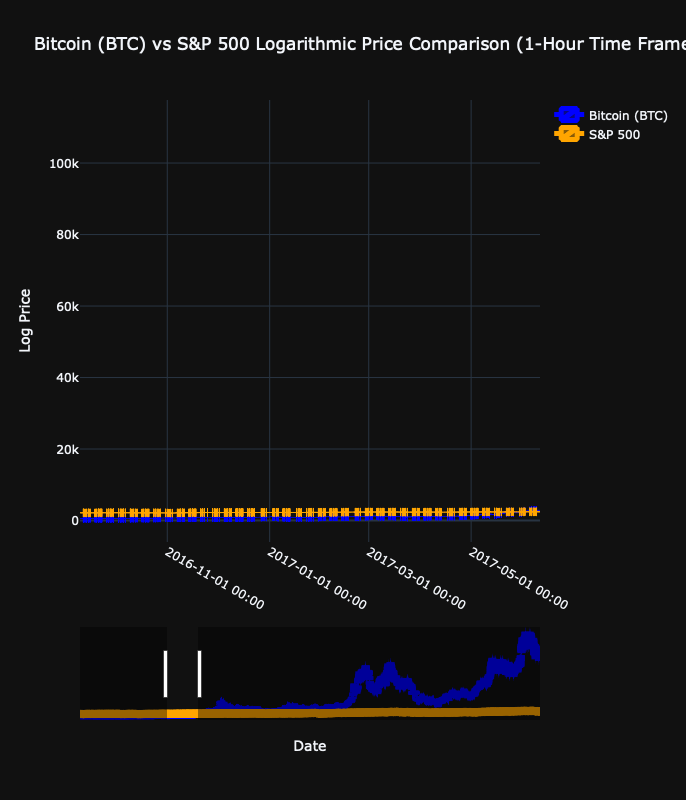

In [51]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='blue', decreasing_line_color='blue',
                             increasing_line_width=8,  # Increased width for thicker candlestick body
                             decreasing_line_width=8,  # Increased width for thicker candlestick body
                             whiskerwidth=0.5,  # Adjusted whisker width to 0.5 (still within the 0-1 range)
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='orange', decreasing_line_color='orange',
                             increasing_line_width=8,  # Increased width for thicker candlestick body
                             decreasing_line_width=8,  # Increased width for thicker candlestick body
                             whiskerwidth=0.5,  # Adjusted whisker width to 0.5 (still within the 0-1 range)
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity, adjust chart size, and make the chart clearer
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    xaxis=dict(
        showgrid=True,  # Show grid for better visualization
        zeroline=False,  # Hide the zero line for cleaner appearance
        rangeslider=dict(visible=True),  # Enable range slider for zooming
        type="date",  # Ensure the x-axis shows date
        tickformat="%Y-%m-%d %H:%M",  # Format for ticks (year-month-day hour-minute)
    ),
    yaxis=dict(
        showgrid=True,  # Show grid for better visualization
    ),
    width=1800,  # Increase width for better clarity
    height=800,  # Increase height for better clarity
    template="plotly_dark",  # Dark background (optional)
    showlegend=True,  # Enable legend for both traces
)

# Show the plot
fig.show()


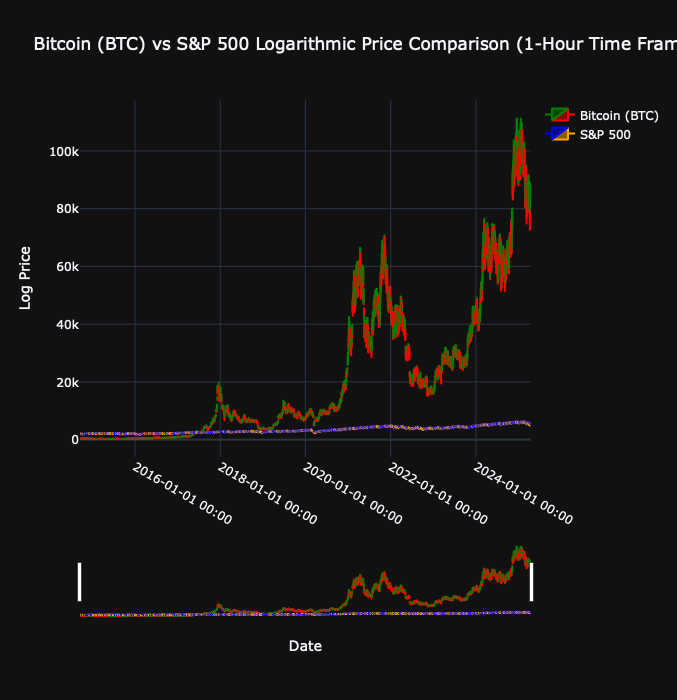

In [52]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h]]
                                 ]]]').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='green', decreasing_line_color='red',
                             increasing_line_width=2,  # Moderate width for clear visual
                             decreasing_line_width=2,  # Moderate width for clear visual
                             whiskerwidth=0.5,  # Adjust whisker width
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='blue', decreasing_line_color='orange',
                             increasing_line_width=2,  # Moderate width for clear visual
                             decreasing_line_width=2,  # Moderate width for clear visual
                             whiskerwidth=0.5,  # Adjust whisker width
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity, adjust chart size, and make the chart clearer
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    xaxis=dict(
        showgrid=True,  # Show grid for better visualization
        zeroline=False,  # Hide the zero line for cleaner appearance
        rangeslider=dict(visible=True),  # Enable range slider for zooming
        type="date",  # Ensure the x-axis shows date
        tickformat="%Y-%m-%d %H:%M",  # Format for ticks (year-month-day hour-minute)
    ),
    yaxis=dict(
        showgrid=True,  # Show grid for better visualization
    ),
    width=1200,  # Medium width for better clarity
    height=700,  # Medium height for better clarity
    template="plotly_dark",  # Dark background (optional)
    showlegend=True,  # Enable legend for both traces
)

# Show the plot
fig.show()


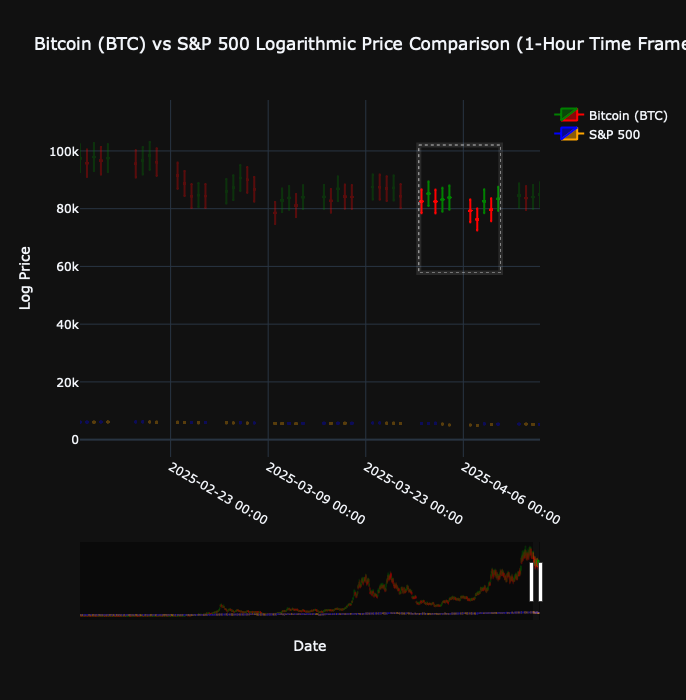

In [54]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

# Load the data (use your actual data paths)
btc_df = pd.read_csv("cleaned_bitcoin_price_2010_to_present.csv", parse_dates=["Date"])
sp500_df = pd.read_csv("cleaned_sp500_price_2010_to_present.csv", parse_dates=["Date"])

# Ensure the data is sorted by Date
btc_df = btc_df.sort_values(by="Date")
sp500_df = sp500_df.sort_values(by="Date")

# Resample both Bitcoin and S&P 500 data to 1-hour frequency
btc_df.set_index('Date', inplace=True)
sp500_df.set_index('Date', inplace=True)

btc_hourly = btc_df.resample('h').last()  # Taking the last price for each hour
sp500_hourly = sp500_df.resample('h').last()

# Filter out negative or zero values before taking log
btc_hourly = btc_hourly[btc_hourly['Close'] > 0]
sp500_hourly = sp500_hourly[sp500_hourly['Close'] > 0]

# Apply log transformation for chart visualization
btc_hourly['log_btc'] = np.log(btc_hourly['Close'])
sp500_hourly['log_sp500'] = np.log(sp500_hourly['Close'])

# Merge the data on Date
merged_df = pd.merge(btc_hourly[['log_btc', 'Close']], sp500_hourly[['log_sp500', 'Close']], 
                     left_index=True, right_index=True, how='inner', suffixes=('_btc', '_sp500'))

# Set up the initial view window (2 days range, or 48 hours)
initial_start_date = merged_df.index[-48]  # Show data from 48 hours before the latest date
initial_end_date = merged_df.index[-1]  # Show data up to the most recent date

# Create the interactive plot with Plotly
fig = go.Figure()

# Create Candlestick for Bitcoin (BTC)
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_btc'],
                             high=merged_df['Close_btc'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_btc'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_btc'],
                             name="Bitcoin (BTC)",
                             increasing_line_color='green', decreasing_line_color='red',
                             increasing_line_width=2,  # Moderate width for clear visual
                             decreasing_line_width=2,  # Moderate width for clear visual
                             whiskerwidth=0.5,  # Adjust whisker width
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_btc']:.2f}<br>Log of Price: {row['log_btc']:.2f}", axis=1)))

# Create Candlestick for S&P 500
fig.add_trace(go.Candlestick(x=merged_df.index,
                             open=merged_df['Close_sp500'],
                             high=merged_df['Close_sp500'] * 1.05,  # Slightly adjust for high value (example)
                             low=merged_df['Close_sp500'] * 0.95,   # Slightly adjust for low value (example)
                             close=merged_df['Close_sp500'],
                             name="S&P 500",
                             increasing_line_color='blue', decreasing_line_color='orange',
                             increasing_line_width=2,  # Moderate width for clear visual
                             decreasing_line_width=2,  # Moderate width for clear visual
                             whiskerwidth=0.5,  # Adjust whisker width
                             hovertext=merged_df.apply(lambda row: f"Date: {row.name}<br>Real Price: {row['Close_sp500']:.2f}<br>Log of Price: {row['log_sp500']:.2f}", axis=1)))

# Update layout for interactivity, adjust chart size, and make the chart clearer
fig.update_layout(
    title="Bitcoin (BTC) vs S&P 500 Logarithmic Price Comparison (1-Hour Time Frame)",
    xaxis_title="Date",
    yaxis_title="Log Price",
    hovermode="x unified",
    xaxis_rangeslider_visible=True,  # Display range slider for zooming
    xaxis=dict(
        showgrid=True,  # Show grid for better visualization
        zeroline=False,  # Hide the zero line for cleaner appearance
        rangeslider=dict(visible=True),  # Enable range slider for zooming
        type="date",  # Ensure the x-axis shows date
        tickformat="%Y-%m-%d %H:%M",  # Format for ticks (year-month-day hour-minute)
        range=[initial_start_date, initial_end_date]  # Limit to 2-day view initially
    ),
    yaxis=dict(
        showgrid=True,  # Show grid for better visualization
    ),
    width=1200,  # Medium width for better clarity
    height=700,  # Medium height for better clarity
    template="plotly_dark",  # Dark background (optional)
    showlegend=True,  # Enable legend for both traces
)

# Show the plot
fig.show()
